In [269]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import MaxPooling2D
from keras.layers import Conv2D
from keras.layers import Flatten
from keras.models import Model
from keras.utils import plot_model
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dropout


from tensorflow.keras.optimizers import SGD

from keras.layers.convolutional import MaxPooling2D

from keras.utils import load_img
from keras.utils import img_to_array
from keras.utils import array_to_img
        

from PIL import Image
from numpy import asarray


In [5]:

train_data_path='./cotton/train'
test_data_path='./cotton/test'




### Data Visualization

bacterial_blight : 436
curl_virus : 406
fussarium_wilt : 407
healthy : 414


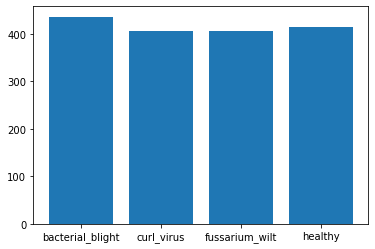

In [6]:

def count_images(path):
    list_diseases=[]
    list_count_images=[]
    for dirname, _, filenames in os.walk(path):
        counter=0
        for filename in filenames:
            img_path=os.path.join(dirname, filename)
            if os.path.isfile(img_path)==True:
                counter=counter+1
        if os.path.isdir(dirname)==True and os.path.basename(dirname)!="train" and os.path.basename(dirname)!="test":
            disease=os.path.basename(dirname)
            print(f"{disease} : {counter}")
            list_count_images.append(counter)
            list_diseases.append(disease)
    plt.bar(list_diseases,list_count_images)
count_images(train_data_path)
    
   

bacterial_blight : 12
curl_virus : 12
fussarium_wilt : 12
healthy : 12


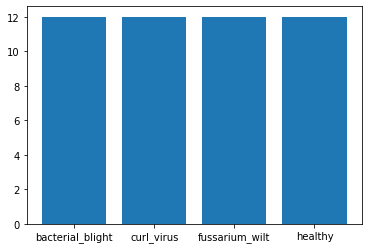

In [7]:
count_images(test_data_path)

In [8]:
def data_generator(shear_value,zoom_value):
    data_gen=ImageDataGenerator(rescale=1/255,
                                 horizontal_flip=True,
                                 vertical_flip=True,
                                 shear_range=shear_value,
                                 zoom_range=zoom_value)
    return data_gen
train_data_gen=data_generator(0.2,0.2)
test_data_gen=data_generator(0.2,0.2)


In [217]:
def create_data(obj,data_path):
    data=obj.flow_from_directory(data_path,
                                            class_mode='categorical',
                                            target_size=(224,224),
                                     shuffle=True)
    return data
        

train_data=create_data(train_data_gen,train_data_path)
test_data=create_data(test_data_gen,test_data_path)


Found 1661 images belonging to 4 classes.
Found 48 images belonging to 4 classes.


In [219]:
sample_train_img_list=[]
for (root, dirs, file) in os.walk(train_data_path):
    for f in file[0:1]:
        file_path=os.path.join(root,f)
        sample_train_img_list.append(file_path)
disease_title=[os.path.basename(root) for (root, dirs, file) in os.walk(test_data_path) if os.path.basename(root)!="test"  ]

In [220]:
len(sample_train_img_list)



4

In [221]:
disease_title

['bacterial_blight', 'curl_virus', 'fussarium_wilt', 'healthy']

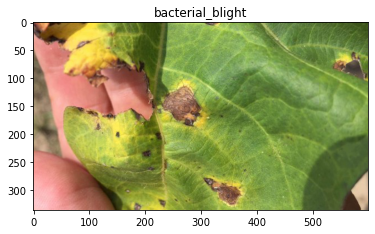

In [222]:
def imgshow(index):
    img=load_img(sample_train_img_list[index])
    img_array=img_to_array(img)
    img_array/255
    img=array_to_img(img_array)
    plt.title(disease_title[index])
    plt.imshow(img)
imgshow(0)

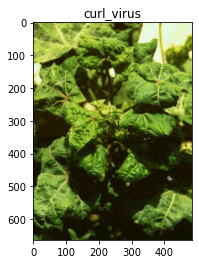

In [223]:
imgshow(1)

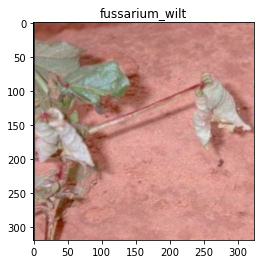

In [224]:
imgshow(2)

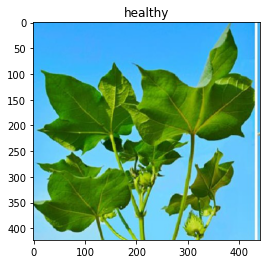

In [225]:
imgshow(3)

In [226]:
img_list=[]
disease_list=[]
for (root, dirs, file) in os.walk(test_data_path):
    for f in file[0:6]:
        img=load_img(os.path.join(root,f))
        img_array=img_to_array(img)
        img_array/255
        img=array_to_img(img_array)
        img_list.append(img)
        disease_list.append(os.path.basename(root))
            

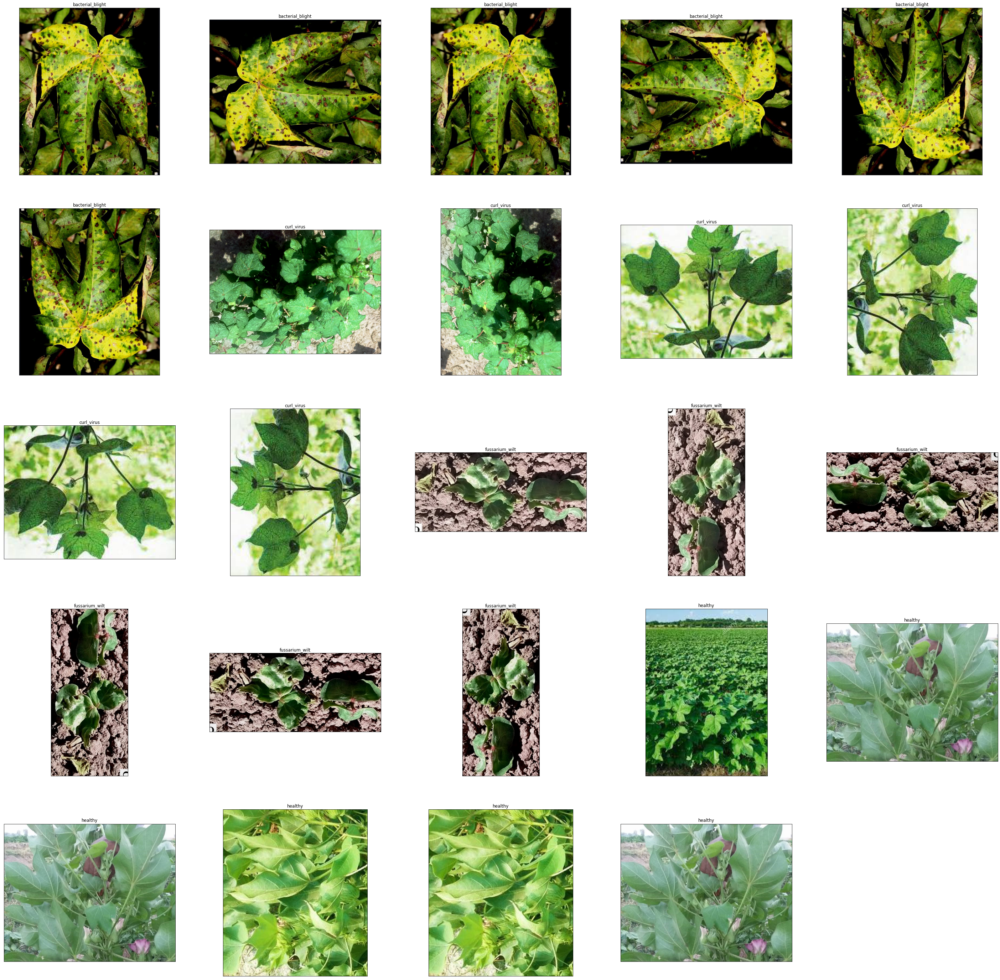

In [227]:
        
plt.figure(figsize=(50,50))
for i in range(len(disease_list)):
    plt.subplot(5,5,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.title(disease_list[i])
    plt.imshow(img_list[i])        
   

### Building Arcitecture of CNN model

In [229]:
class Classifier_model:
    def __init__(self,model_name):
        self.classifier=model_name
    def building_model(self):
        self.classifier.add(
            Conv2D(32, (3, 3), input_shape =(224, 224,3), 
            activation = 'relu'))

        # 2 X 2 Matrix in pooling
        self.classifier.add(MaxPooling2D(pool_size = (2, 2)))

        self.classifier.add(Conv2D(112, (3, 3), activation = 'relu',padding='same'))
        # classifier.add(MaxPooling2D(pool_size = (2, 2)))
        self.classifier.add(Conv2D(112, (3, 3), activation = 'relu',padding='same'))
        self.classifier.add(MaxPooling2D(pool_size = (2, 2)))


        self.classifier.add(Conv2D(64, (3, 3), activation = 'relu',padding='same'))
        # classifier.add(MaxPooling2D(pool_size = (2, 2)))
        self.classifier.add(Conv2D(64, (3, 3), activation = 'relu',padding='same'))
        self.classifier.add(MaxPooling2D(pool_size = (2, 2)))

        self.classifier.add(Conv2D(32, (3, 3), activation = 'relu',padding='same'))
        # classifier.add(MaxPooling2D(pool_size = (2, 2)))
        self.classifier.add(Conv2D(32, (3, 3), activation = 'relu',padding='same'))
        self.classifier.add(MaxPooling2D(pool_size = (2, 2)))

        self.classifier.add(Conv2D(16, (3, 3), activation = 'relu',padding='same'))
        # classifier.add(MaxPooling2D(pool_size = (2, 2)))
        self.classifier.add(Conv2D(16, (3, 3), activation = 'relu',padding='same'))
        self.classifier.add(MaxPooling2D(pool_size = (2, 2)))




        self.classifier.add(Conv2D(8, (3, 3), activation = 'relu',padding='same'))
        self.classifier.add(MaxPooling2D(pool_size = (2, 2)))
        # Convert 2D to 1D array
        self.classifier.add(Flatten())

        # classifier.add(Dense(units = 128, activation = 'relu')
        self.classifier.add(Dense(units = 4, activation = 'softmax'))

        # Compiling the CNN
        self.classifier.compile(optimizer = 'adam', 
                           loss = 'categorical_crossentropy', 
                           metrics = ['accuracy'])
        return self.classifier
        

In [230]:
obj1=Classifier_model(Sequential())
classification_model=obj1.building_model()
classification_model.summary()

Model: "sequential_12"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_111 (Conv2D)         (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_67 (MaxPoolin  (None, 111, 111, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_112 (Conv2D)         (None, 111, 111, 112)     32368     
                                                                 
 conv2d_113 (Conv2D)         (None, 111, 111, 112)     113008    
                                                                 
 max_pooling2d_68 (MaxPoolin  (None, 55, 55, 112)      0         
 g2D)                                                            
                                                                 
 conv2d_114 (Conv2D)         (None, 55, 55, 64)      

In [233]:
model_history=classification_model.fit(train_data,
              validation_data=test_data,
              epochs=2)

Epoch 1/2
52/52 [==============================] - 587s 11s/step - loss: 1.0250 - accuracy: 0.5292 - val_loss: 0.7504 - val_accuracy: 0.6458
Epoch 2/2
52/52 [==============================] - 519s 10s/step - loss: 0.9268 - accuracy: 0.5695 - val_loss: 0.7966 - val_accuracy: 0.6667


### Plotting Graphs

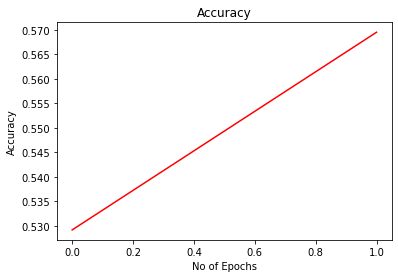

In [236]:
plt.title("Accuracy")
plt.xlabel("No of Epochs")
plt.ylabel("Accuracy")
plt.plot(model_history.history['accuracy'],color='g')
 
    



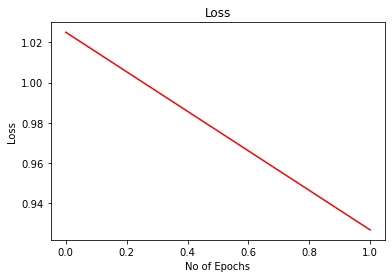

In [237]:
plt.title("Loss")
plt.xlabel("No of Epochs")
plt.ylabel("Loss")
plt.plot(model_history.history['loss'],color='r')

In [320]:
#This is just for demo purpose
import tensorflow as tf
path = './cotton_model_version_2.h5'
classifier_pretrained_model= tf.keras.models.load_model(path )


### Testing model on data

In [321]:
def test_image(img_path):
    file_exists = os.path.exists(file_path)
    if file_exists==True:
        img =load_img(img_path, target_size=(224,224,3))
        array_form= img_to_array(img)
        x = np.expand_dims(array_form/225, axis=0)
        result= classifier_pretrained_model.predict(x)
        str=""
        if preds[0][0]==1:
            str="Bacterial blight"
        elif preds[0][1]==1:
            str="Curl virus"
        elif preds[0][2]==1:
            str="Fussarium wilt"
        else:
            str="Healthy!"
    return disease_name

        
            



    

    

In [325]:
print('No of classesin thhe test data')
print(test_data.class_indices)


No of classesin thhe test data
{'bacterial_blight': 0, 'curl_virus': 1, 'fussarium_wilt': 2, 'healthy': 3}


1/1 [==============================] - 0s 94ms/step


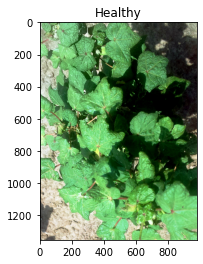

In [326]:
path='cotton/test/curl_virus/curl420.png'
name=test_image(path)
plt.title(name)
img=load_img(path)
img_array=img_to_array(img)
img_array/255
img=array_to_img(img_array)
plt.imshow(img)

### Email sending code

In [ ]:
import smtplib
fromaddr = 'user_me@gmail.com'
toaddrs  = 'user_you@gmail.com'
msg = 'Why,Oh why!'
username = 'user_me@gmail.com'
password = 'pwd'
server = smtplib.SMTP('smtp.gmail.com:587')
server.starttls()
server.login(username,password)
server.sendmail(fromaddr, toaddrs, msg)
server.quit()